In [ ]:
from IPython.display import display, HTML

display(HTML('''
<div style="
    background-color: #e6ffe6;
    padding: 20px;
    border-radius: 12px;
    text-align: center;
">
  <div style="
      font-size: 48px;
      font-weight: bold;
      color: #006400;
      text-decoration: underline;
  ">
    Airbnb Price Prediction
  </div>
</div>
'''))


#### Objective
This project focuses on analyzing and modeling Airbnb listings to understand the key drivers of rental prices. By leveraging machine learning techniques, the goal is to help hosts and potential guests gain insights into pricing patterns and improve price transparency across different cities.

# Airbnb_price_prediction_video_link = https://drive.google.com/file/d/18bpOWv6Jl81yTlQ6LQdjP5QiPd9VoH8G/view?usp=sharing

## 1. Importing Libraries


In [ ]:
!pip install ydata-profiling --quiet
!pip install catboost --quiet
!pip install squarify


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.0/679.0 kB 39.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.4 MB/s eta 0:00:00


In [ ]:
#importing important libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import squarify
from tqdm import tqdm



from sklearn.model_selection import GridSearchCV
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from datetime import datetime
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor


import warnings
warnings.filterwarnings("ignore")




## 2. Data Import & Description

In [ ]:
# Load datasets
airbnb_df = pd.read_csv("Airbnb_data.csv", engine='python', on_bad_lines='skip')

In [ ]:
airbnb_df.head(5)

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,thumbnail_url,zipcode,bedrooms,beds
0,6901257,5.010635,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1.0,Real Bed,strict,True,...,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,100.0,https://a0.muscache.com/im/pictures/6d7cbbf7-c...,11201,1.0,1.0
1,6304928,5.129899,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1.0,Real Bed,strict,True,...,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,93.0,https://a0.muscache.com/im/pictures/348a55fe-4...,10019,3.0,3.0
2,7919400,4.976734,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1.0,Real Bed,moderate,True,...,40.808110,-73.943756,The Garden Oasis,Harlem,10,92.0,https://a0.muscache.com/im/pictures/6fae5362-9...,10027,1.0,3.0
3,13418779,6.620073,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,flexible,True,...,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,NaN,https://a0.muscache.com/im/pictures/72208dad-9...,94117,2.0,2.0
4,3808709,4.744932,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1.0,Real Bed,moderate,True,...,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,40.0,NaN,20009,0.0,1.0


In [ ]:
#(no. of rows , no. of columns)
airbnb_df.shape

(74111, 29)

In [ ]:
airbnb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74111 entries, 0 to 74110
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      74111 non-null  int64  
 1   log_price               74111 non-null  float64
 2   property_type           74111 non-null  object 
 3   room_type               74111 non-null  object 
 4   amenities               74111 non-null  object 
 5   accommodates            74111 non-null  int64  
 6   bathrooms               73911 non-null  float64
 7   bed_type                74111 non-null  object 
 8   cancellation_policy     74111 non-null  object 
 9   cleaning_fee            74111 non-null  bool   
 10  city                    74111 non-null  object 
 11  description             74111 non-null  object 
 12  first_review            58247 non-null  object 
 13  host_has_profile_pic    73923 non-null  object 
 14  host_identity_verified  73923 non-null

- **Profile Report of all the features**

In [ ]:

# Create the report
profile = ProfileReport(airbnb_df, title="Airbnb Dataset Profile Report", explorative=True)

# Show it directly in notebook
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 29/29 [00:35<00:00,  1.23s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- **Summary table**

In [ ]:
summary = []

for col in airbnb_df.columns:
    dtype = airbnb_df[col].dtype
    missing = airbnb_df[col].isnull().sum()
    unique_vals = airbnb_df[col].nunique()

    # Determine column type
    if dtype == 'object':
        col_type = 'Categorical'
    elif dtype == 'bool':
        col_type = 'Boolean'
    elif np.issubdtype(dtype, np.number):
        col_type = 'Numerical'
    elif np.issubdtype(dtype, np.datetime64):
        col_type = 'Datetime'
    else:
        col_type = 'Other'

    sample_vals = airbnb_df[col].dropna().unique()[:3]  # Show up to 3 sample values

    summary.append({
        'Column': col,
        'Data Type': dtype,
        'Column Type': col_type,
        'Missing Values': missing,
        'Unique Values': unique_vals,
        'Sample Values': sample_vals
    })

# Create summary DataFrame
summary_df = pd.DataFrame(summary)

# Display sorted summary
summary_df = summary_df.sort_values(by='Column Type')
pd.set_option('display.max_colwidth', 100)  # Show full sample values
display(summary_df)


,Column,Data Type,Column Type,Missing Values,Unique Values,Sample Values
9,cleaning_fee,bool,Boolean,0,2,"[True, False]"
14,host_identity_verified,object,Categorical,188,2,"[t, f]"
18,last_review,object,Categorical,15827,1371,"[18-07-2016, 23-09-2017, 14-09-2017]"
17,instant_bookable,object,Categorical,0,2,"[f, t]"
16,host_since,object,Categorical,188,3087,"[26-03-2012, 19-06-2017, 25-10-2016]"
15,host_response_rate,object,Categorical,18299,80,"[100%, 71%, 68%]"
13,host_has_profile_pic,object,Categorical,188,2,"[t, f]"
12,first_review,object,Categorical,15864,2554,"[18-06-2016, 05-08-2017, 30-04-2017]"
11,description,object,Categorical,0,73474,"[Beautiful, sunlit brownstone 1-bedroom in the loveliest neighborhood in Brooklyn. Blocks from t..."
22,neighbourhood,object,Categorical,6872,619,"[Brooklyn Heights, Hell's Kitchen, Harlem]"


## 3.Dropping Duplicate rows


In [ ]:
# Count total duplicate rows
duplicate_rows = airbnb_df.duplicated()
print("Number of duplicate rows:", duplicate_rows.sum())


Number of duplicate rows: 0


In [ ]:
# Drop duplicates
airbnb_df = airbnb_df.drop_duplicates()


## 4.Feature Engineering

### What is Feature Engineering?
Feature Engineering is the process of:
- Selecting the most useful column , modifying existing ones and creating new features.
- It helps models learn more meaningful patterns.
- Can turn non-useful columns into gold .Often boosts accuracy more than tuning models

These features will help capture hidden patterns in data better. So we will create these  5 new columns.
1. Number of amenities
2. Host experience in days
3. Price Per Person
4. Is Shared Room
5. Group rare neighbourhoods



In [ ]:

#  1. Price per person
airbnb_df['price_per_person'] = np.expm1(airbnb_df['log_price']) / airbnb_df['accommodates']

#  2. Is Shared Room (binary feature)
airbnb_df['is_shared_room'] = airbnb_df['room_type_Shared room'] if 'room_type_Shared room' in airbnb_df.columns else 0

#  3. Host experience in days (based on 'host_since', if it's still available)
if 'host_since' in airbnb_df.columns:
    airbnb_df['host_since'] = pd.to_datetime(airbnb_df['host_since'], errors='coerce')
    airbnb_df['host_experience_days'] = (datetime.now() - airbnb_df['host_since']).dt.days
else:
    print("Column 'host_since' not found, skipping 'host_experience_days'")

#  4. Number of amenities
if 'amenities' in airbnb_df.columns:
    airbnb_df['amenities_count'] = airbnb_df['amenities'].apply(
        lambda x: len(x.strip('{}').split(',')) if pd.notnull(x) else 0
    )
else:
    print("Column 'amenities' not found, skipping 'amenities_count'")

#  5. Group rare neighbourhoods
if 'neighbourhood' in airbnb_df.columns:
    top_neigh = airbnb_df['neighbourhood'].value_counts().nlargest(10).index
    airbnb_df['neighbourhood_grouped'] = airbnb_df['neighbourhood'].apply(
        lambda x: x if x in top_neigh else 'Other'
    )
else:
    print("Column 'neighbourhood' not found, skipping 'neighbourhood_grouped'")


In [ ]:
#rechecking some newly added columns
airbnb_df[['price_per_person', 'is_shared_room']].head()


,price_per_person,is_shared_room
0,49.666667,0
1,24.000000,0
2,28.800000,0
3,187.250000,0
4,57.000000,0


## 5.Handling missing values

In [ ]:
# Calculate missing count and percentage
missing_count = airbnb_df.isnull().sum()
missing_percent = (missing_count / len(airbnb_df)) * 100

# Combine into one DataFrame
missing_df = pd.DataFrame({
    'Column Name': missing_count.index,
    'Missing Count': missing_count.values,
    'Missing Percentage (%)': missing_percent.values
})

# Filter only rows with missing values and sort
missing_df = missing_df[missing_df['Missing Count'] > 0].sort_values(by='Missing Count', ascending=False)

# Round percentage
missing_df['Missing Percentage (%)'] = missing_df['Missing Percentage (%)'].round(2)

# Reset index
missing_df.reset_index(drop=True, inplace=True)

# Display
print(" Missing Values Summary Table:")
display(missing_df)


 Missing Values Summary Table:


,Column Name,Missing Count,Missing Percentage (%)
0,host_response_rate,18299,24.69
1,review_scores_rating,16722,22.56
2,first_review,15864,21.41
3,last_review,15827,21.36
4,thumbnail_url,8216,11.09
5,neighbourhood,6872,9.27
6,zipcode,968,1.31
7,bathrooms,200,0.27
8,host_has_profile_pic,188,0.25
9,host_identity_verified,188,0.25


In [ ]:
# 1. Fill categorical/text fields with mode or custom label
airbnb_df['host_response_rate'].fillna('0%', inplace=True)
airbnb_df['neighbourhood'].fillna('Unknown', inplace=True)
airbnb_df['host_identity_verified'].fillna(airbnb_df['host_identity_verified'].mode()[0], inplace=True)
airbnb_df['host_has_profile_pic'].fillna(airbnb_df['host_has_profile_pic'].mode()[0], inplace=True)
airbnb_df['host_since'].fillna(airbnb_df['host_since'].mode()[0], inplace=True)

# 2. Fill numerical fields with median
airbnb_df['review_scores_rating'].fillna(airbnb_df['review_scores_rating'].median(), inplace=True)
airbnb_df['bathrooms'].fillna(airbnb_df['bathrooms'].median(), inplace=True)
airbnb_df['beds'].fillna(airbnb_df['beds'].median(), inplace=True)
airbnb_df['bedrooms'].fillna(airbnb_df['bedrooms'].median(), inplace=True)
airbnb_df['host_experience_days'] = airbnb_df['host_experience_days'].fillna(airbnb_df['host_experience_days'].median())


In [ ]:
#double check of null values
airbnb_df.isnull().sum().sort_values(ascending=False).head(10)


,0
first_review,15864
last_review,15827
thumbnail_url,8216
zipcode,968
log_price,0
id,0
bathrooms,0
property_type,0
amenities,0
room_type,0


## 6.Dropping
columns_to_drop = ['id','name','description','first_review', 'last_review', 'thumbnail_url','zipcode','price_per_person','is_shared_room',       'neighbourhood_grouped']

In [ ]:
# Final lists based on EDA + correlation + domain knowledge

columns_to_keep = [
    'log_price',
    'accommodates', 'bedrooms', 'beds', 'bathrooms',
    'review_scores_rating', 'cleaning_fee',
    'property_type', 'room_type', 'bed_type', 'cancellation_policy',
    'instant_bookable', 'host_response_rate', 'host_has_profile_pic',
    'host_identity_verified', 'host_since', 'amenities', 'neighbourhood', 'city', 'latitude', 'longitude',
    'amenities_count', 'host_experience_days', 'number_of_reviews'
]

columns_to_drop = [col for col in airbnb_df.columns if col not in columns_to_keep]

print(f" No. of Columns to KEEP: {len(columns_to_keep)}")
print(columns_to_keep)

print(f"\nNo. of Columns to DROP: {len(columns_to_drop)}")
print(columns_to_drop)

# Create the filtered DataFrame for modeling
airbnb_df = airbnb_df[columns_to_keep]


 No. of Columns to KEEP: 24
['log_price', 'accommodates', 'bedrooms', 'beds', 'bathrooms', 'review_scores_rating', 'cleaning_fee', 'property_type', 'room_type', 'bed_type', 'cancellation_policy', 'instant_bookable', 'host_response_rate', 'host_has_profile_pic', 'host_identity_verified', 'host_since', 'amenities', 'neighbourhood', 'city', 'latitude', 'longitude', 'amenities_count', 'host_experience_days', 'number_of_reviews']

No. of Columns to DROP: 10
['id', 'description', 'first_review', 'last_review', 'name', 'thumbnail_url', 'zipcode', 'price_per_person', 'is_shared_room', 'neighbourhood_grouped']


In [ ]:

# Final selected columns
final_cols = ['log_price', 'accommodates', 'bedrooms', 'beds', 'bathrooms', 'review_scores_rating', 'cleaning_fee', 'property_type', 'room_type',
              'bed_type', 'cancellation_policy', 'instant_bookable', 'host_response_rate', 'host_has_profile_pic', 'host_identity_verified',
            'host_since', 'amenities', 'neighbourhood', 'city', 'latitude', 'longitude', 'amenities_count', 'host_experience_days', 'number_of_reviews']


# Subset the DataFrame
selected_df = airbnb_df[final_cols]

# Categorize columns
numerical_cols = selected_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = selected_df.select_dtypes(include='object').columns.tolist()
boolean_cols = selected_df.select_dtypes(include='bool').columns.tolist()
datetime_cols = selected_df.select_dtypes(include='datetime64').columns.tolist()

# Optional: You can treat datetime as categorical or keep it separate
# For display, include datetime under categorical for simplicity
categorical_cols += datetime_cols

# Create a vertical table where each row is a type and each column is a feature name
max_len = max(len(numerical_cols), len(categorical_cols), len(boolean_cols))
data = {
    'Numerical': numerical_cols + [''] * (max_len - len(numerical_cols)),
    'Categorical': categorical_cols + [''] * (max_len - len(categorical_cols)),
    'Boolean': boolean_cols + [''] * (max_len - len(boolean_cols))
}

# Create DataFrame
type_table = pd.DataFrame(data)

# Display
type_table


,Numerical,Categorical,Boolean
0,log_price,property_type,cleaning_fee
1,accommodates,room_type,
2,bedrooms,bed_type,
3,beds,cancellation_policy,
4,bathrooms,instant_bookable,
5,review_scores_rating,host_response_rate,
6,latitude,host_has_profile_pic,
7,longitude,host_identity_verified,
8,amenities_count,amenities,
9,host_experience_days,neighbourhood,


## 7.Handling columns

### 1. Numerical Columns

## 1.1 **Checking correlation between all numerical columns and see correlation btw featues and target values**


 Correlation with log_price:
 log_price               1.000000
accommodates            0.567574
bedrooms                0.473028
beds                    0.441953
bathrooms               0.355174
amenities_count         0.194528
review_scores_rating    0.084180
host_experience_days    0.078275
latitude               -0.002193
number_of_reviews      -0.032470
longitude              -0.047529
Name: log_price, dtype: float64


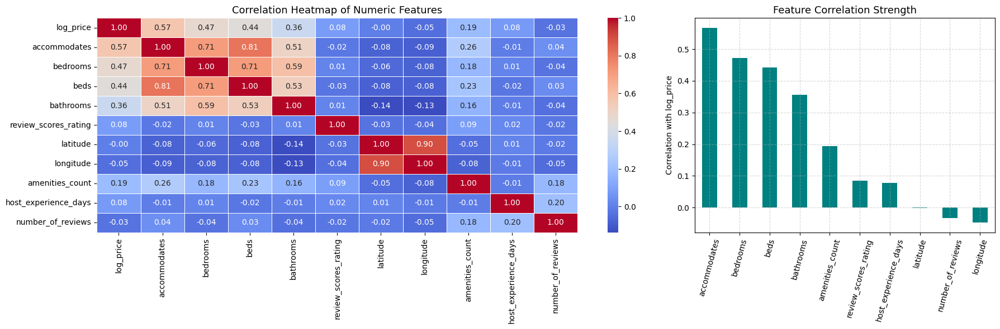

In [ ]:
# Select only numeric columns
numeric_cols = airbnb_df.select_dtypes(include=['number'])

# Compute correlation matrix
correlation_matrix = numeric_cols.corr()

# Display correlation with log_price
price_corr = correlation_matrix['log_price'].sort_values(ascending=False)
print(" Correlation with log_price:\n", price_corr)


# Select numeric columns
numeric_cols = airbnb_df.select_dtypes(include=['number'])

# Compute correlation matrix
correlation_matrix = numeric_cols.corr()

# Correlation with log_price
price_corr = correlation_matrix['log_price'].sort_values(ascending=False)

# Create subplots: heatmap and vertical bar plot
fig, axes = plt.subplots(1, 2, figsize=(18, 6), gridspec_kw={'width_ratios': [2, 1]})

# Subplot 1: Correlation Heatmap
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f",
            linewidths=0.5, ax=axes[0])
axes[0].set_title("Correlation Heatmap of Numeric Features", fontsize=13)

# Subplot 2: Vertical Bar Plot
price_corr.drop('log_price').sort_values(ascending=False).plot(kind='bar', color='teal', ax=axes[1])
axes[1].set_ylabel("Correlation with log_price")
axes[1].set_title("Feature Correlation Strength", fontsize=13)
axes[1].tick_params(axis='x', rotation=75)
axes[1].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


- From the correlation heatmap and bar plot, we observe that features like accommodates, bedrooms, beds, and bathrooms show moderate to strong positive correlation with log_price, indicating that listings with more capacity and facilities are generally priced higher.
- On the other hand, features like latitude, longitude, and review_scores_rating show weak or negligible correlation.
-Correlation is a helpful indicator, but should not be the sole basis for dropping features. For instance, although latitude and longitude show near-zero correlation with log_price, they represent geographic location, which can strongly influence prices in non-linear ways — something tree-based models like CatBoost or XGBoost can effectively capture. Hence, we retain such features for modeling.

## 1.2 **Outlier Detection**

Histograms of Numerical Features:



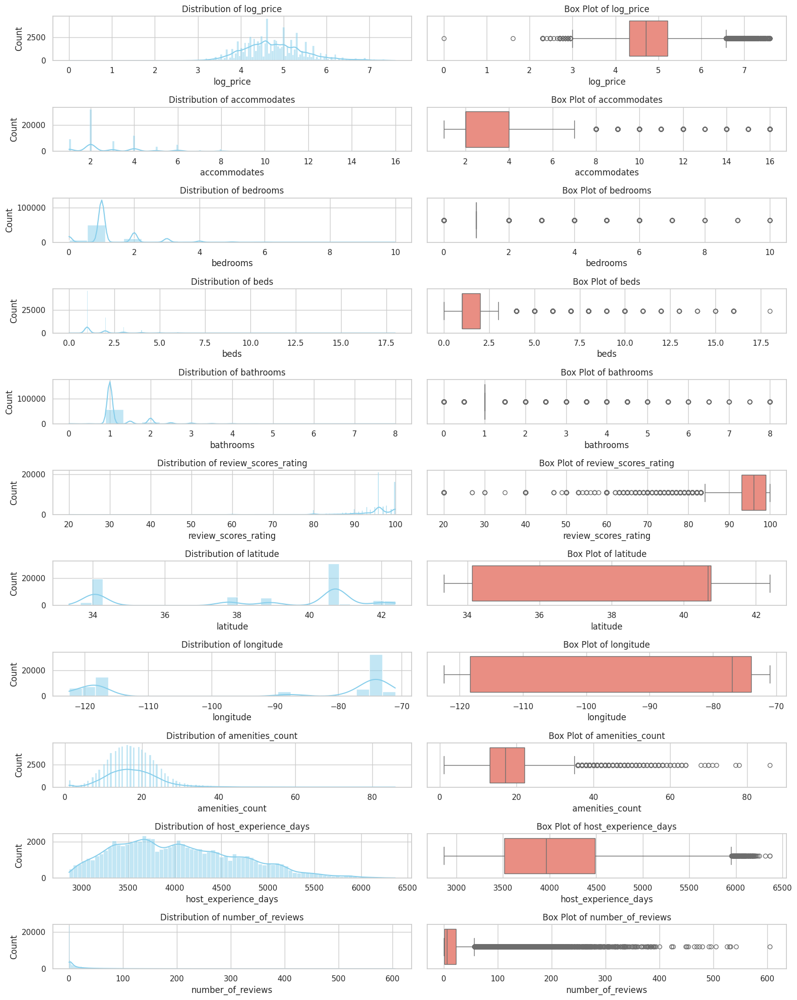

In [ ]:

# List of numerical columns
num_cols =['log_price','accommodates','bedrooms','beds','bathrooms','review_scores_rating','latitude','longitude','amenities_count','host_experience_days',
 'number_of_reviews']

# Set style
sns.set(style="whitegrid")
plt.figure(figsize=(16, 20))

# Plot Histograms
print("Histograms of Numerical Features:\n")
for i, col in enumerate(num_cols):
    plt.subplot(len(num_cols), 2, 2*i+1)
    sns.histplot(airbnb_df[col], kde=True, color='skyblue')
    plt.title(f'Distribution of {col}')

    # Box Plot
    plt.subplot(len(num_cols), 2, 2*i+2)
    sns.boxplot(x=airbnb_df[col], color='salmon')
    plt.title(f'Box Plot of {col}')

plt.tight_layout()
plt.show()


- Outliers can skew the model, especially linear models .
- But removing too many can also lose valuable data, especially for large/expensive listings.
- We prefer capping first to retain data diversity (e.g., luxury listings). If needed, we apply IQR filtering later, but only on columns with limited variance.
- Outliers in Airbnb (like huge villas) are real listings, not data errors.


| Action                               | Why                                                 |
| ------------------------------------ | --------------------------------------------------- |
|  Cap outliers (1st–99th percentile) | Keeps dataset size large, avoids distortion         |
| Can't remove outliers (IQR method) | Too aggressive — lose valid extreme listings |
| Can't ignore outliers             | They’ll hurt model accuracy and cause overfitting   |



- Capping

In [ ]:
# Capping values at the 1st and 99th percentile helps keep your dataset clean without deleting valuable data.
# List of numeric columns for capping
num_cols = [
    'log_price', 'accommodates', 'bedrooms', 'beds', 'bathrooms',
    'review_scores_rating', 'latitude', 'longitude',
    'amenities_count', 'host_experience_days', 'number_of_reviews'
]

original_df = airbnb_df[num_cols].copy()

# Apply 1st–99th percentile capping
for col in num_cols:
    if col in airbnb_df.columns:
        lower = airbnb_df[col].quantile(0.01)
        upper = airbnb_df[col].quantile(0.99)
        airbnb_df[col] = airbnb_df[col].clip(lower=lower, upper=upper)
        print(f"Capped outliers in '{col}' between {round(lower, 2)} and {round(upper, 2)}")
    else:
        print(f" Column '{col}' not found in DataFrame")



Capped outliers in 'log_price' between 3.37 and 6.89
Capped outliers in 'accommodates' between 1.0 and 12.0
Capped outliers in 'bedrooms' between 0.0 and 4.0
Capped outliers in 'beds' between 1.0 and 6.0
Capped outliers in 'bathrooms' between 1.0 and 3.5
Capped outliers in 'review_scores_rating' between 65.0 and 100.0
Capped outliers in 'latitude' between 33.79 and 42.36
Capped outliers in 'longitude' between -122.46 and -71.06
Capped outliers in 'amenities_count' between 1.0 and 39.0
Capped outliers in 'host_experience_days' between 2927.0 and 5718.0
Capped outliers in 'number_of_reviews' between 0.0 and 178.0


### Before and after capping visual

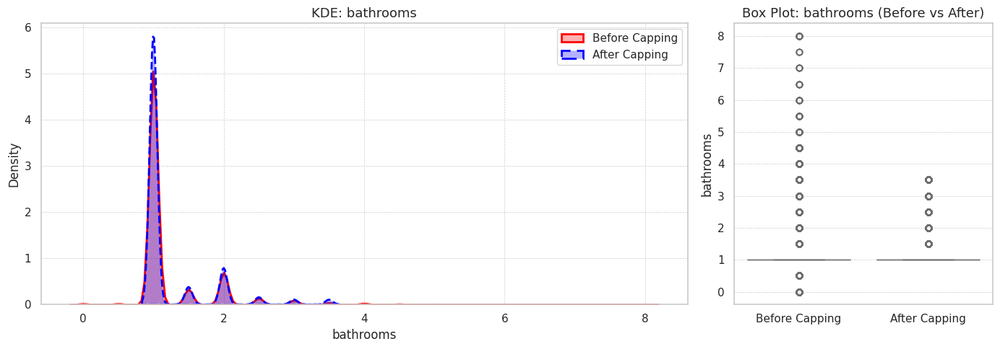

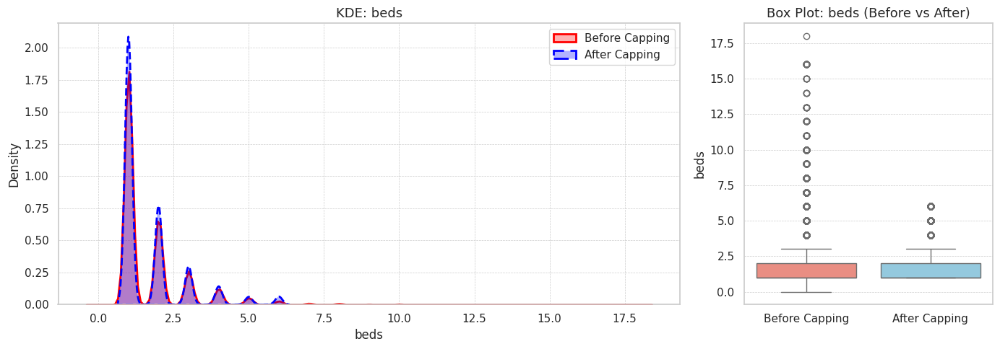

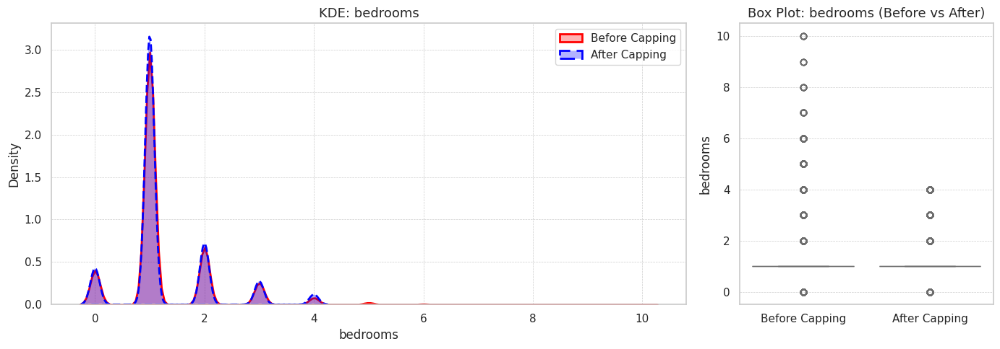

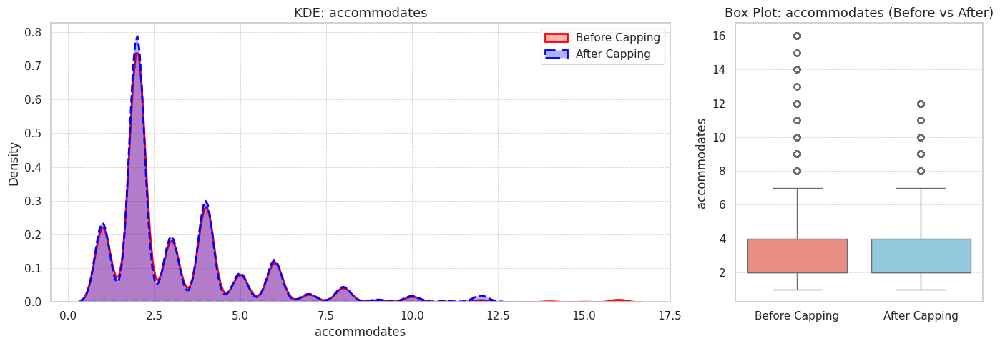

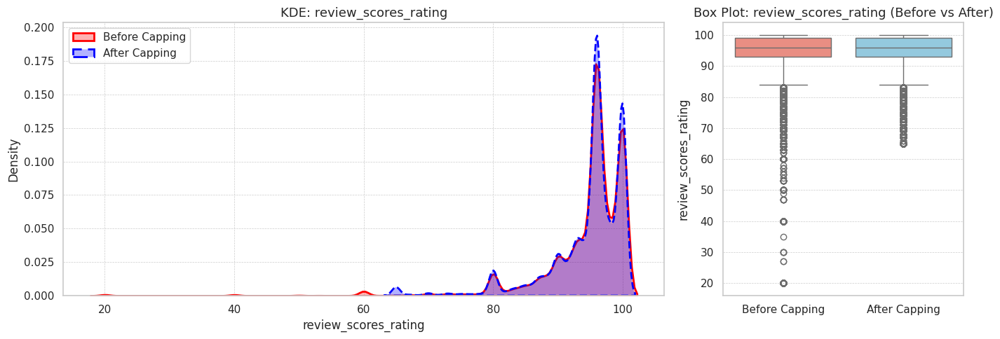

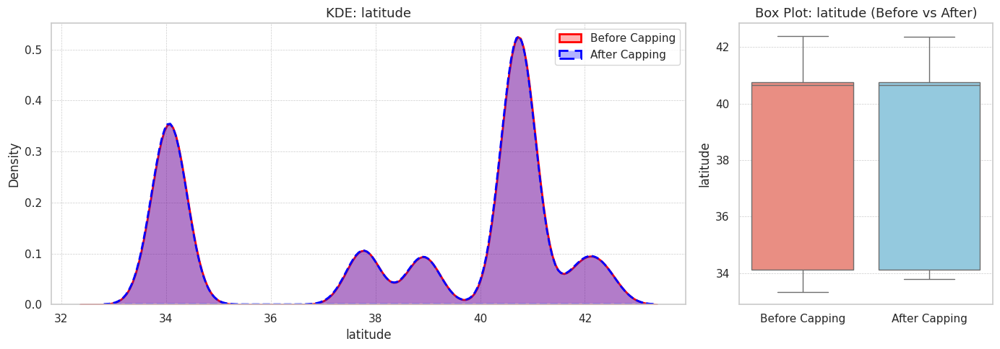

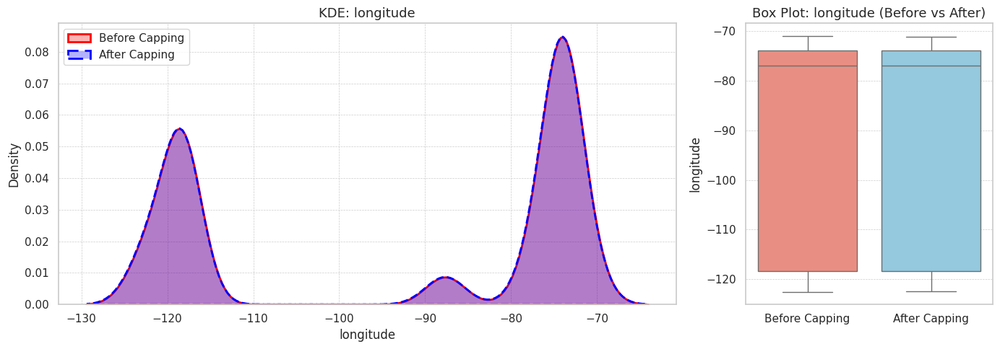

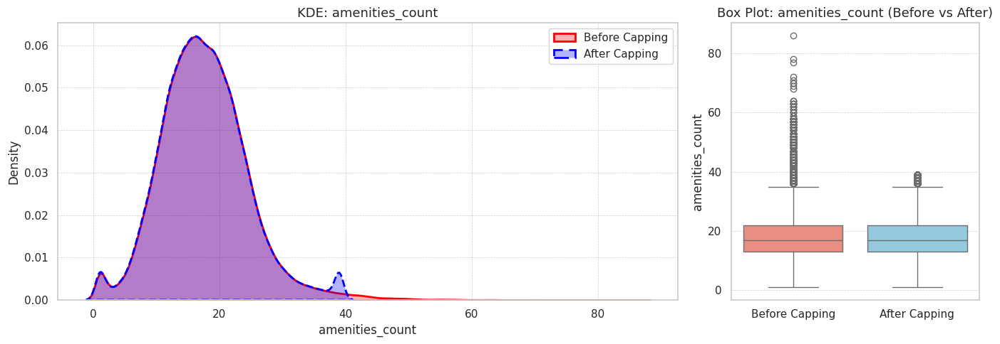

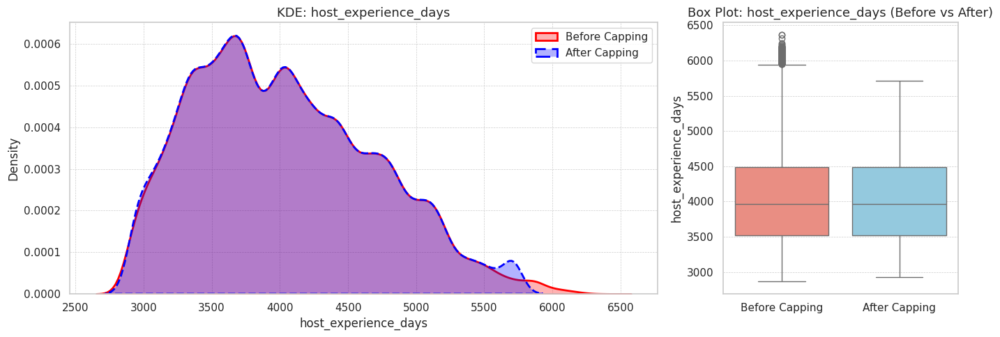

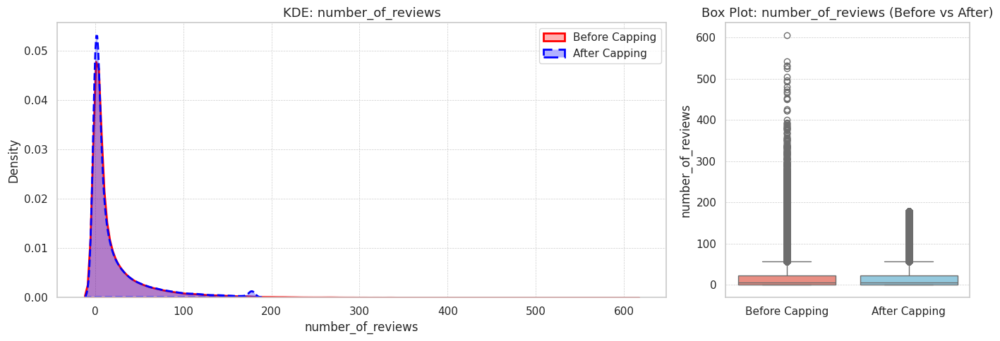

In [ ]:
# Create a new DataFrame to hold values for combined boxplot
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cols = ['bathrooms', 'beds', 'bedrooms', 'accommodates', 'review_scores_rating',
        'latitude', 'longitude', 'amenities_count', 'host_experience_days', 'number_of_reviews']

for col in cols:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5), gridspec_kw={'width_ratios': [2.5, 1]})

    # KDE plot (before vs after)
    sns.kdeplot(
        original_df[col],
        label='Before Capping',
        color='red',
        linewidth=2,
        fill=True,
        alpha=0.3,
        ax=axes[0]
    )
    sns.kdeplot(
        airbnb_df[col],
        label='After Capping',
        color='blue',
        linestyle='--',
        linewidth=2,
        fill=True,
        alpha=0.3,
        ax=axes[0]
    )
    axes[0].set_title(f"KDE: {col}", fontsize=13)
    axes[0].set_xlabel(col)
    axes[0].set_ylabel("Density")
    axes[0].legend()
    axes[0].grid(True, linestyle='--', linewidth=0.5)

    # Combine data for boxplot
    box_df = pd.DataFrame({
        col: pd.concat([original_df[col], airbnb_df[col]], axis=0),
        'State': ['Before Capping'] * len(original_df) + ['After Capping'] * len(airbnb_df)
    })

    # Box plot: Before vs After side-by-side
    sns.boxplot(data=box_df, x="State", y=col, palette=["salmon", "skyblue"], ax=axes[1])
    axes[1].set_title(f"Box Plot: {col} (Before vs After)", fontsize=13)
    axes[1].set_xlabel("")
    axes[1].set_ylabel(col)
    axes[1].grid(True, axis='y', linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()


In [ ]:
capped_cols = ['bathrooms', 'bedrooms', 'beds', 'accommodates', 'review_scores_rating',
               'latitude', 'longitude', 'amenities_count', 'host_experience_days', 'number_of_reviews']

for col in capped_cols:    equal = (original_df[col] == airbnb_df[col]).all()
    print(f"{col}: {'No Change' if equal else 'Changed'}")


bathrooms: Changed
bedrooms: Changed
beds: Changed
accommodates: Changed
review_scores_rating: Changed
latitude: Changed
longitude: Changed
amenities_count: Changed
host_experience_days: Changed
number_of_reviews: Changed


## Insights
- Outliers are significantly reduced, especially in accommodates, beds, host_experience_days, number_of_reviews, etc.
- Capping works well here because it keeps the overall shape/distribution and removes harmful extremes, aiding models that are sensitive to scale or outliers .
- No major data loss, and diversity is preserved (compared to dropping rows or applying IQR harshly).

- Good balance between retaining valuable variation (like for luxury listings) and ensuring statistical stability.




## Checking skewness since capping didn't help much.

In [ ]:
skewness_values = airbnb_df[num_cols].skew()
print("Skewness of Numerical Columns:\n")
print(skewness_values)

Skewness of Numerical Columns:

log_price               0.511258
accommodates            1.771048
bedrooms                1.380371
beds                    1.967050
bathrooms               2.471597
review_scores_rating   -2.286465
latitude               -0.534722
longitude              -0.407097
amenities_count         0.435392
host_experience_days    0.439012
number_of_reviews       2.621210
dtype: float64


## Actions to take for each column.
-  We will apply log transformation + IQR to Highly skewed (> +1 or < -1)columns.

| Feature                                   | Skewness  | Action Needed?                     |
| ----------------------------------------- | --------- | ---------------------------------- |
| `number_of_reviews`                       | **2.63**  | Transform + IQR                  |
| `bathrooms`                               | **2.47**  | Transform + IQR                  |
| `beds`                                    | **1.97**  |  Transform + IQR                  |
| `accommodates`                            | **1.78**  | Transform + IQR                  |
| `bedrooms`                                | **1.37**  |  Transform + IQR                  |
| `review_scores_rating`                    | **-2.31** | Transform (handle negative skew) |
| `latitude`, `longitude`                   | \~-0.5    | Minor Skew — Leave As-Is         |
| `log_price`                               | 0.5       | Already Transformed (Fine)       |
| `amenities_count`, `host_experience_days` | \~0.43    | No transform needed              |



Step 1: Apply Log Transform
(Only for positively skewed columns)

In [ ]:

log_transform_cols = ['number_of_reviews', 'bathrooms', 'beds', 'accommodates', 'bedrooms']

for col in log_transform_cols:
    airbnb_df[f'{col}_log'] = np.log1p(airbnb_df[col])  # log1p handles 0 safely


Step 2: Apply Reverse Log to Negative Skew

In [ ]:
# Flip it to positive skew, then log
airbnb_df['review_scores_rating_log'] = np.log1p(100- airbnb_df['review_scores_rating'])


Step 3: Apply IQR Capping

Applying IQR capping to only these:
- number_of_reviews_log	- Still heavily skewed after log
- review_scores_rating_log	- Minor outliers

Tree models can handle this already, but this helps linear models without hurting tree models much.

#### Note - IQR Capping is not done on **accommodates_log, beds_log, bedrooms_log, or bathrooms_log**, as that removes meaningful variance.



In [ ]:
# === Step 2: Apply IQR Capping (only where needed) ===
def iqr_cap(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return column.clip(lower=lower_bound, upper=upper_bound)

airbnb_df['number_of_reviews_log'] = iqr_cap(airbnb_df['number_of_reviews_log'])
airbnb_df['review_scores_rating_log'] = iqr_cap(airbnb_df['review_scores_rating_log'])

### Before and after IQR + Log transform Visualization

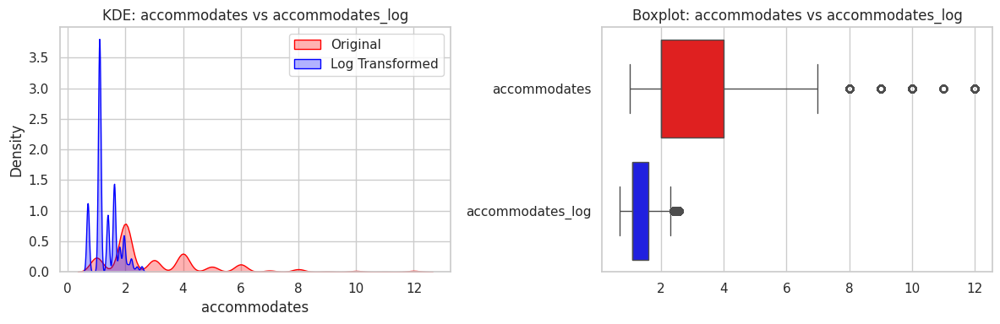

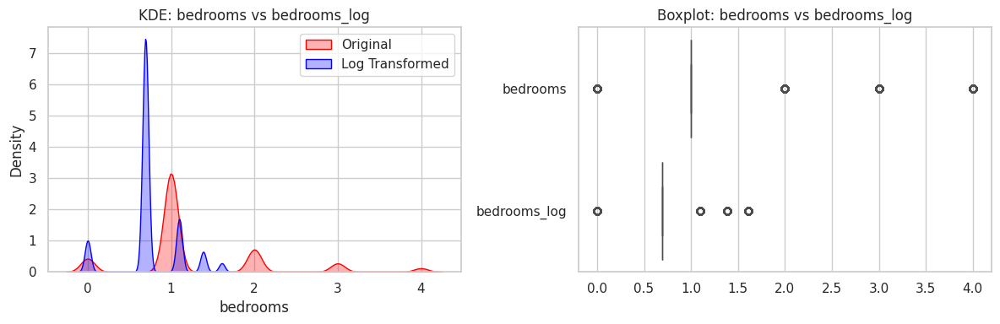

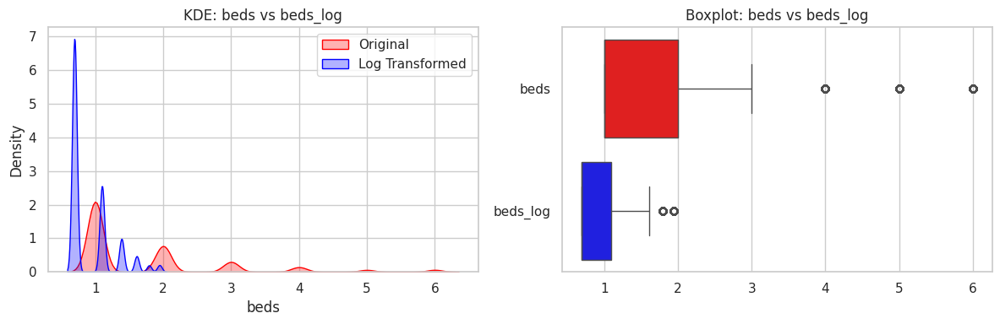

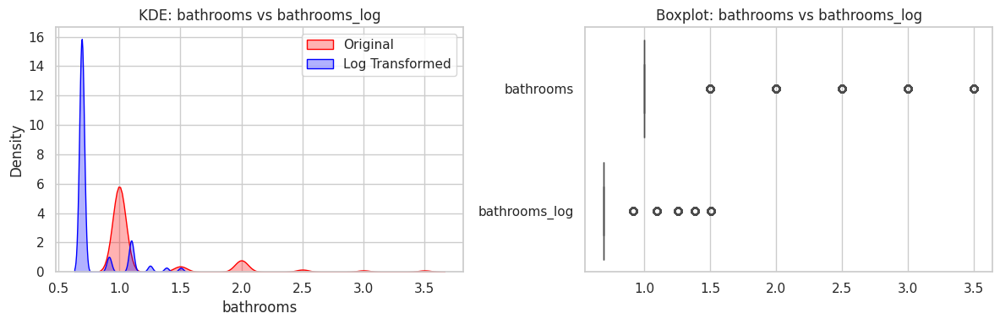

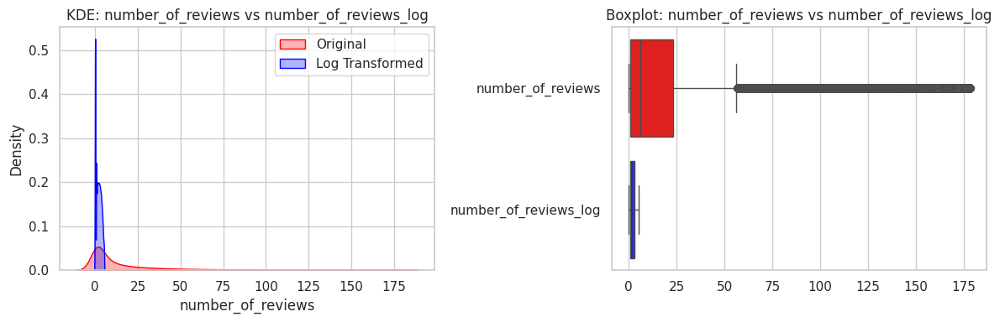

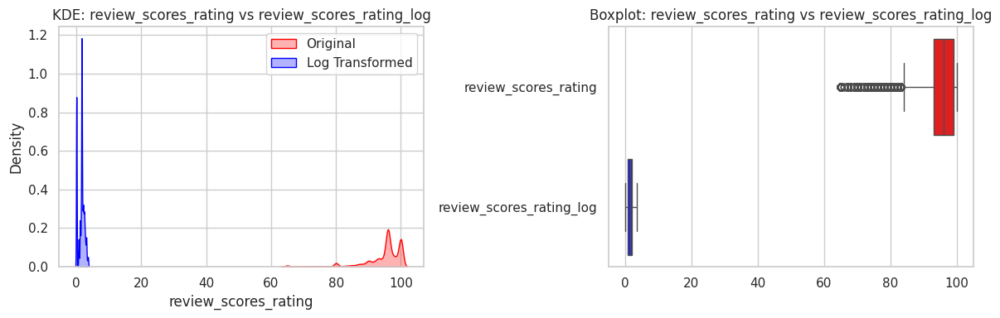

In [ ]:

# Features to log transform
all_log_cols = ['accommodates', 'bedrooms', 'beds', 'bathrooms', 'number_of_reviews','review_scores_rating']


for col in all_log_cols:
    log_col = f'{col}_log'
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # KDE Plot
    sns.kdeplot(airbnb_df[col], label='Original', color='red', fill=True, alpha=0.3, ax=axes[0])
    sns.kdeplot(airbnb_df[log_col], label='Log Transformed', color='blue', fill=True, alpha=0.3, ax=axes[0])
    axes[0].set_title(f'KDE: {col} vs {log_col}')
    axes[0].legend()

    # Box Plot
    sns.boxplot(data=airbnb_df[[col, log_col]], orient="h", ax=axes[1], palette=['red', 'blue'])
    axes[1].set_title(f'Boxplot: {col} vs {log_col}')

    plt.tight_layout()
    plt.show()


**Applied log transforms to reduce skewness, followed by selective IQR capping only where outliers remained impactful for linear models. Tree-based models benefit from the full variance, so most features were left IQR uncapped.**



| Feature                | Transformation Applied             | Reason                                 | Visualization Result                          |
| ---------------------- | ---------------------------------- | -------------------------------------- | --------------------------------------------- |
| `accommodates`         | `log1p`                            | Right-skewed → compressed              | KDE: Symmetric, Boxplot: fewer outliers       |
| `bedrooms`             | `log1p`                            | Slight right skew                      | KDE improved, but boxplot shows some outliers |
| `beds`                 | `log1p`                            | Right-skewed                           | KDE improved, some outliers remain            |
| `bathrooms`            | `log1p`                            | Strong right skew                      | KDE improved, still a few outliers            |
| `number_of_reviews`    | `log1p` + **IQR capping**          | Heavy outliers even after log          | KDE better, Boxplot: long tail reduced        |
| `review_scores_rating` | `log1p(100 - x)` + **IQR capping** | Left-skewed (inverted) + mild outliers | KDE centered, Boxplot: clean after capping    |


#### Final numerical columns

In [ ]:
# Step 1: Drop original columns that were log-transformed
cols_to_drop = [
    'accommodates',
    'bedrooms',
    'beds',
    'bathrooms',
    'review_scores_rating',
    'number_of_reviews',

]

# Drop if present
airbnb_df.drop(columns=cols_to_drop, inplace=True, errors='ignore')

# Step 2: Show final numerical columns
final_numeric_cols = [
    'log_price',
    'accommodates_log',
    'bedrooms_log',
    'beds_log',
    'bathrooms_log',
    'review_scores_rating_log',
    'latitude',
    'longitude',
    'amenities_count',
    'host_experience_days',
    'number_of_reviews_log'
]

print(" Final Numerical Columns for Modeling:")
print(final_numeric_cols)

# Step 3: Reassure no missing values
missing = airbnb_df[final_numeric_cols].isnull().sum()
print("\n🔍 Missing Values Check:")
print(missing[missing > 0] if missing.sum() > 0 else " No missing values in final numerical features.")


 Final Numerical Columns for Modeling:
['log_price', 'accommodates_log', 'bedrooms_log', 'beds_log', 'bathrooms_log', 'review_scores_rating_log', 'latitude', 'longitude', 'amenities_count', 'host_experience_days', 'number_of_reviews_log']

🔍 Missing Values Check:
 No missing values in final numerical features.


## Checking rest columns

In [ ]:
# Categorical columns (object or category dtype)
categorical_cols = airbnb_df.select_dtypes(include=['object', 'category']).columns.tolist()

# Boolean columns (dtype == bool)
boolean_cols = airbnb_df.select_dtypes(include='bool').columns.tolist()

# Optional: Columns with exactly 2 unique values (binary features)
binary_like_cols = [col for col in airbnb_df.columns if airbnb_df[col].nunique() == 2 and col not in boolean_cols]

# Output
print(" Categorical Columns:")
print(categorical_cols)

print("\n Boolean Columns:")
print(boolean_cols)

print("\nBinary-like Columns (non-bool but 2 unique values):")
print(binary_like_cols)


 Categorical Columns:
['property_type', 'room_type', 'bed_type', 'cancellation_policy', 'instant_bookable', 'host_response_rate', 'host_has_profile_pic', 'host_identity_verified', 'amenities', 'neighbourhood', 'city']

 Boolean Columns:
['cleaning_fee']

Binary-like Columns (non-bool but 2 unique values):
['instant_bookable', 'host_has_profile_pic', 'host_identity_verified']


In [ ]:
#rechecking if any missing value presents
# Combine all relevant columns
all_cat_cols = [
    'property_type', 'room_type', 'bed_type', 'cancellation_policy', 'instant_bookable',
    'host_response_rate', 'host_has_profile_pic', 'host_identity_verified',
    'amenities', 'neighbourhood', 'city', 'cleaning_fee'
]

# Check for missing values
missing_cat = airbnb_df[all_cat_cols].isnull().sum()

# Show only those with missing values
missing_with_na = missing_cat[missing_cat > 0]

# Output
print(" Missing Values in Categorical / Binary / Boolean Columns:")
print(missing_with_na if not missing_with_na.empty else " No missing values found.")


 Missing Values in Categorical / Binary / Boolean Columns:
 No missing values found.


### 1.2 Binary Columns
These can be safely label encoded:

In [ ]:
binary_cols = ['instant_bookable', 'host_has_profile_pic', 'host_identity_verified']
airbnb_df[binary_cols] = airbnb_df[binary_cols].apply(lambda x: x.map({'t': 1, 'f': 0}) if x.dtype == 'object' else x)
airbnb_df[binary_cols]

,instant_bookable,host_has_profile_pic,host_identity_verified
0,0,1,1
1,1,1,0
2,1,1,1
3,0,1,1
4,1,1,1
...,...,...,...
74106,0,1,1
74107,0,1,0
74108,1,1,1
74109,1,1,0


### 1.3 Boolean Column

In [ ]:
#Converting true/false to 1/0
airbnb_df['cleaning_fee'] = airbnb_df['cleaning_fee'].astype(int)
airbnb_df['cleaning_fee']

,cleaning_fee
0,1
1,1
2,1
3,1
4,1
...,...
74106,0
74107,1
74108,1
74109,1


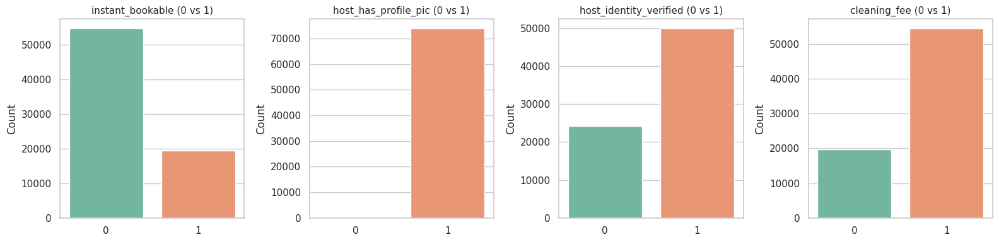

In [ ]:
#visualization of binary and bollean columns

# Define binary columns
binary_cols = ['instant_bookable', 'host_has_profile_pic', 'host_identity_verified', 'cleaning_fee']

# Create subplots
fig, axes = plt.subplots(1, len(binary_cols), figsize=(16, 4))

for i, col in enumerate(binary_cols):
    sns.countplot(data=airbnb_df, x=col, ax=axes[i], palette='Set2')
    axes[i].set_title(f'{col} (0 vs 1)', fontsize=11)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Count')
    axes[i].set_xticklabels(['0', '1'])

plt.tight_layout()
plt.show()


| Column                   | Observations        | Action Needed?          |
| ------------------------ | ------------------- | ----------------------- |
| `instant_bookable`       | More 0s than 1s     |  Keep                   |
| `host_has_profile_pic`   | Almost all 1s       |  Can be dropped                       |
| `host_identity_verified` | Somewhat imbalanced |  Keep                   |
| `cleaning_fee`           | Fairly balanced     |  Keep                   |


The column 'host_has_profile_pic' was dropped because it had low variance — the vast majority of values were 1, indicating almost all hosts had a profile picture. Due to this near-constant behavior, it contributed little to model learning we will drop it.


In [ ]:
airbnb_df.drop(columns=['host_has_profile_pic'], inplace=True)


### 1.4 Catagorical Columns

In [ ]:
#All catagorical columns are as follows
categorical_cols=['property_type', 'room_type', 'bed_type', 'cancellation_policy', 'instant_bookable', 'host_response_rate', 'host_identity_verified', 'amenities', 'neighbourhood', 'city']
airbnb_df[categorical_cols]

,property_type,room_type,bed_type,cancellation_policy,instant_bookable,host_response_rate,host_identity_verified,amenities,neighbourhood,city
0,Apartment,Entire home/apt,Real Bed,strict,0,0%,1,"{""Wireless Internet"",""Air conditioning"",Kitchen,Heating,""Family/kid friendly"",Essentials,""Hair d...",Brooklyn Heights,NYC
1,Apartment,Entire home/apt,Real Bed,strict,1,100%,0,"{""Wireless Internet"",""Air conditioning"",Kitchen,Heating,""Family/kid friendly"",Washer,Dryer,""Smok...",Hell's Kitchen,NYC
2,Apartment,Entire home/apt,Real Bed,moderate,1,100%,1,"{TV,""Cable TV"",""Wireless Internet"",""Air conditioning"",Kitchen,Breakfast,""Buzzer/wireless interco...",Harlem,NYC
3,House,Entire home/apt,Real Bed,flexible,0,0%,1,"{TV,""Cable TV"",Internet,""Wireless Internet"",Kitchen,""Indoor fireplace"",""Buzzer/wireless intercom...",Lower Haight,SF
4,Apartment,Entire home/apt,Real Bed,moderate,1,100%,1,"{TV,Internet,""Wireless Internet"",""Air conditioning"",Kitchen,""Elevator in building"",Heating,""Smok...",Columbia Heights,DC
...,...,...,...,...,...,...,...,...,...,...
74106,Apartment,Private room,Real Bed,flexible,0,0%,1,{},Williamsburg,NYC
74107,Apartment,Entire home/apt,Real Bed,moderate,0,100%,0,"{TV,""Cable TV"",Internet,""Wireless Internet"",Kitchen,""Free parking on premises"",Heating,""Family/k...",Hermosa Beach,LA
74108,Apartment,Entire home/apt,Real Bed,moderate,1,100%,1,"{TV,Internet,""Wireless Internet"",""Air conditioning"",Kitchen,Gym,Elevator,""Buzzer/wireless interc...",Williamsburg,NYC
74109,Apartment,Entire home/apt,Real Bed,strict,1,100%,0,"{TV,""Wireless Internet"",""Air conditioning"",Kitchen,Heating,Washer,Dryer,""Smoke detector"",""Carbon...",West Village,NYC


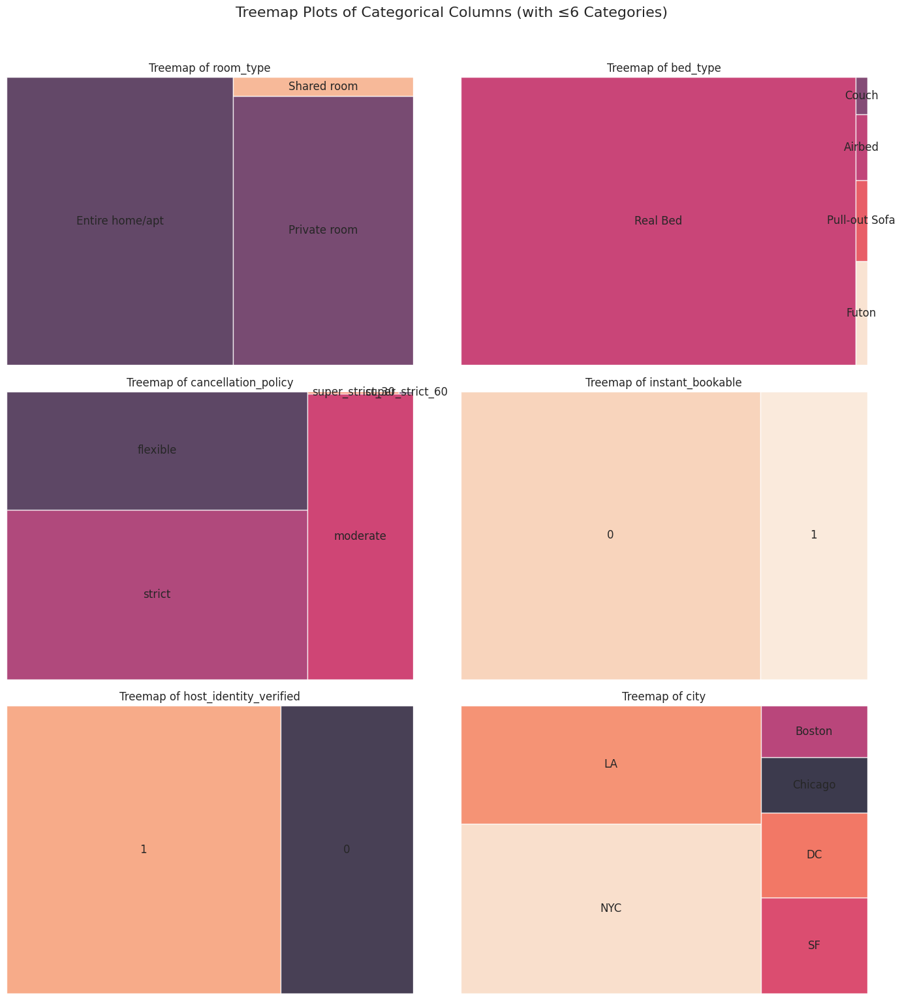

In [ ]:


# Columns with fewer unique values (<=6 for better readability)
short_cats = [col for col in categorical_cols if airbnb_df[col].nunique() <= 6]

# Set layout
n_cols = 2
n_rows = -(-len(short_cats) // n_cols)  # Ceiling division
plt.figure(figsize=(14, n_rows * 5))

# Create tree maps
for i, col in enumerate(short_cats, 1):
    plt.subplot(n_rows, n_cols, i)
    values = airbnb_df[col].value_counts()
    squarify.plot(sizes=values.values, label=values.index, alpha=.8)
    plt.title(f"Treemap of {col}")
    plt.axis('off')

plt.suptitle("Treemap Plots of Categorical Columns (with ≤6 Categories)", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()



### Roadmap to handle catagorical columns

| Encoding Type               | Columns                                                                                                           | Notes / Reasoning                                                                                                                                                                                                          |
| --------------------------- | ----------------------------------------------------------------------------------------------------------------- | -------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| **One-Hot Encoding**        | `property_type`, `room_type`, `bed_type`, `cancellation_policy`,<br>`host_response_rate`, `neighbourhood`, `city` | Converts each category into a binary feature <br> → `drop_first=True` to avoid dummy variable trap                                                                                                                         |
| **Special Handling Needed** | `amenities`                                                                                                       | This column contains a **set of items as a string** like: <br> `"{Wifi, Kitchen, TV}"` <br> → Needs to be split and parsed <br> → Optional: extract top amenities as individual features (e.g., `has_wifi`, `has_kitchen`) |


In [ ]:

# STEP 1: One-Hot Encode Multiclass Categorical Columns
one_hot_cols = [
    'property_type', 'room_type', 'bed_type',
    'cancellation_policy', 'host_response_rate',
    'neighbourhood', 'city'
]
# Proper One-Hot Encoding — with int dtype
airbnb_df = pd.get_dummies(airbnb_df, columns=one_hot_cols, drop_first=True,dtype=int)

# STEP 2: Handle `amenities` column - create features like has_wifi, has_kitchen. Extracting top 10 most common amenities into binary flags
from collections import Counter

# Flatten and count all amenities
all_amenities = airbnb_df['amenities'].dropna().str.replace("{|}", "").str.split(", ")
flat_amenities = [item for sublist in all_amenities for item in sublist]
top_amenities = [amenity for amenity, _ in Counter(flat_amenities).most_common(10)]

# Create binary features for top amenities
for amenity in top_amenities:
    airbnb_df[f'has_{amenity.lower().replace(" ", "_")}'] = airbnb_df['amenities'].apply(
        lambda x: int(amenity in x) if pd.notnull(x) else 0
    )

# STEP 3: Drop original `amenities` column if no longer needed
airbnb_df.drop(columns='amenities', inplace=True)





In [ ]:
airbnb_df

,log_price,cleaning_fee,instant_bookable,host_identity_verified,host_since,latitude,longitude,amenities_count,host_experience_days,number_of_reviews_log,...,has_{},"has_{""translation_missing:_en.hosting_amenity_49"",""translation_missing:_en.hosting_amenity_50""}","has_{""family/kid_friendly""}","has_smooth_pathway_to_front_door"",""well-lit_path_to_entrance""}","has_{""pets_allowed"",""family/kid_friendly""}","has_{tv,""cable_tv"",internet,""wireless_internet"",""air_conditioning"",kitchen,""pets_allowed"",doorman,gym,elevator,heating,""family/kid_friendly"",washer,dryer,""smoke_detector"",""carbon_monoxide_detector"",essentials,shampoo,""24-hour_check-in"",hangers,""hair_dryer"",iron,""laptop_friendly_workspace"",""self_check-in"",doorman}","has_{""family/kid_friendly"",""translation_missing:_en.hosting_amenity_50""}","has_{tv,internet,""wireless_internet"",""air_conditioning"",kitchen,heating,essentials}","has_{tv,""cable_tv"",internet,""wireless_internet"",""air_conditioning"",kitchen,""free_parking_on_premises"",heating,""family/kid_friendly"",washer,dryer,""smoke_detector"",""carbon_monoxide_detector"",""first_aid_kit"",""safety_card"",""fire_extinguisher"",essentials,shampoo,""24-hour_check-in"",hangers,""hair_dryer"",iron,""laptop_friendly_workspace""}","has_{tv,""cable_tv"",internet,""wireless_internet"",""air_conditioning"",kitchen,heating}"
0,5.010635,1,0,1,2012-03-26,40.696524,-73.991617,9,4882.0,1.098612,...,0,0,0,0,0,0,0,0,0,0
1,5.129899,1,1,0,2017-06-19,40.766115,-73.989040,15,2971.0,1.945910,...,0,0,0,0,0,0,0,0,0,0
2,4.976734,1,1,1,2016-10-25,40.808110,-73.943756,19,3208.0,2.397895,...,0,0,0,0,0,0,0,0,0,0
3,6.620073,1,0,1,2015-04-19,37.772004,-122.431619,15,3763.0,0.000000,...,0,0,0,0,0,0,0,0,0,0
4,4.744932,1,1,1,2015-03-01,38.925627,-77.034596,12,3812.0,1.609438,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,4.605170,0,0,1,2013-03-24,40.709025,-73.939405,1,4519.0,0.000000,...,1,0,0,0,0,0,0,0,0,0
74107,5.043425,1,0,0,2016-05-03,33.871549,-118.396053,16,3383.0,2.833213,...,0,0,0,0,0,0,0,0,0,0
74108,5.220356,1,1,1,2012-01-05,40.706749,-73.942377,31,4963.0,3.784190,...,0,0,0,0,0,0,0,0,0,0
74109,5.273000,1,1,0,2017-09-17,40.738535,-74.000157,15,2927.0,0.000000,...,0,0,0,0,0,0,0,0,0,0


### 1.5 Datetime Column

In [ ]:
# Convert to datetime
airbnb_df['host_since'] = pd.to_datetime(airbnb_df['host_since'], errors='coerce')

# Today's date (or you can use max date in dataset)
today = pd.to_datetime('today')

# Feature: Days of experience
airbnb_df['host_experience_days'] = (today - airbnb_df['host_since']).dt.days

# Optional: Extract year/month
airbnb_df['host_year'] = airbnb_df['host_since'].dt.year
airbnb_df['host_month'] = airbnb_df['host_since'].dt.month

# Drop original non-numeric column
airbnb_df.drop('host_since', axis=1, inplace=True)


### 1.6 Handling Constant Columns

In [ ]:
# Find and drop constant columns from airbnb_df
constant_cols = [col for col in airbnb_df.columns if airbnb_df[col].nunique() == 1]
airbnb_df.drop(columns=constant_cols, inplace=True)

# Print dropped column names
print(f"Dropped {len(constant_cols)} constant columns:")
print(constant_cols)


Dropped 0 constant columns:
[]


## 8.Data Splitting

In [ ]:


# Separate features and target
X = airbnb_df.drop('log_price', axis=1)
y = airbnb_df['log_price']


# First split: Train + Temp (Temp = Val + Test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)

# Second split: Validation + Test (50/50 of the remaining 30%)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

print(f"Train size: {len(X_train)}, Validation size: {len(X_val)}, Test size: {len(X_test)}")



Train size: 51877, Validation size: 11117, Test size: 11117


In [ ]:
#final check if in data everything looks good
print("NaNs in X_train:", X_train.isnull().sum().sum())
print("NaNs in X_val:", X_val.isnull().sum().sum())
print("Infs in X_train:", np.isinf(X_train).sum().sum())
print("Infs in X_val:", np.isinf(X_val).sum().sum())


print("NaNs in y_train:", y_train.isnull().sum())
print("Infs in y_train:", np.isinf(y_train).sum())


print(X_train.dtypes.value_counts())

print(type(X_train))
print(type(y_train))


constant_cols = [col for col in airbnb_df.columns if airbnb_df[col].nunique() <= 1]
print("Constant columns:", constant_cols)

non_numeric_cols = X_train.select_dtypes(exclude=[np.number]).columns.tolist()
print("Non-numeric columns:", non_numeric_cols)


NaNs in X_train: 0
NaNs in X_val: 0
Infs in X_train: 0
Infs in X_val: 0
NaNs in y_train: 0
Infs in y_train: 0
int64      762
float64      8
int32        2
Name: count, dtype: int64
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>
Constant columns: []
Non-numeric columns: []


## 9.Data Training

**Step-by-Step Workflow Using Train, Validation, and Test Sets:**
- Step 1: Split the Data
70% Train,15% Validation,15% Test

- Step 2:
Train All Models on the Training Set. Perform hyperparameter tunning.
Evaluate them on the validation set to compare performance.

- Step 3: Select Best Model Based on Validation Set.
Choose the model with:
The lowest RMSE ,MAE
The highest R² Score

- Step 4: Final Test Set Evaluation.
Once picked the best model, evaluate it on the test set:


| Phase      | Dataset Used         | Purpose                          |
| ---------- | -------------------- | -------------------------------- |
| Training   | `X_train`, `y_train` | Fit models                       |
| Validation | `X_val`, `y_val`     | Compare model performance        |
| Testing    | `X_test`, `y_test`   | Final unbiased performance check |


In [ ]:


# Define models with logging disabled
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42, verbosity=0),
    "CatBoost": CatBoostRegressor(verbose=0, random_state=42)
}

# Store validation results
results = {
    "Model": [],
    "Val RMSE": [],
    "Val R² Score": [],
    "Val MAE": []
}

# Train and evaluate on validation set with tqdm loop
for name, model in tqdm(models.items(), desc="Training models", ncols=100):
    model.fit(X_train, y_train)
    val_preds = model.predict(X_val)

    rmse = np.sqrt(mean_squared_error(y_val, val_preds))
    r2 = r2_score(y_val, val_preds)
    mae = mean_absolute_error(y_val, val_preds)

    results["Model"].append(name)
    results["Val RMSE"].append(round(rmse, 4))
    results["Val R² Score"].append(round(r2, 4))
    results["Val MAE"].append(round(mae, 4))

# Create summary DataFrame
val_results_df = pd.DataFrame(results).sort_values(by="Val RMSE")

# Display a nice colored table if in Jupyter
try:
    from IPython.display import display
    display(val_results_df.style.background_gradient(cmap='YlGnBu')
            .set_caption("🔍 Model Performance on Validation Set")
            .format(precision=4))
except:
    # Fallback to clean text table
    print(val_results_df.to_string(index=False))


Training models: 100%|████████████████████████████████████████████████| 5/5 [05:45<00:00, 69.02s/it]


,Model,Val RMSE,Val R² Score,Val MAE
4,CatBoost,0.3762,0.7100,0.2746
1,Random Forest,0.3821,0.7008,0.2769
3,XGBoost,0.3839,0.6980,0.2809
2,Gradient Boosting,0.4048,0.6642,0.3007
0,Linear Regression,0.4113,0.6533,0.3049


- CatBoost clearly outperforms all other models and is the best candidate for final evaluation.
- Ensemble models (XGBoost, RF, GBM) all perform significantly better than Linear Regression, confirming non-linearity in the data.
- MAE and RMSE are lowest for CatBoost, indicating better error handling even with potential outliers.


| Model             | RMSE ↓     | R² ↑       | MAE ↓      | Comments                                                 |
| ----------------- | ---------- | ---------- | ---------- | -------------------------------------------------------- |
| **CatBoost**      | **0.3762** | **0.7100** | **0.2746** |  Best overall performance — lowest error and highest R² |
| Random Forest     | 0.3821     | 0.7008     | 0.2769     | Very close to CatBoost                                   |
| XGBoost           | 0.3839     | 0.6980     | 0.2809     | Good, but slightly worse than RF                         |
| Gradient Boosting | 0.4048     | 0.6642     | 0.3007     | Acceptable, but less accurate                            |
| Linear Regression | 0.4113     | 0.6533     | 0.3049     | Weakest among all — underfits due to simplicity          |



### Radar Chart
- Each corner of the triangle represents a metric .Combines 3 metrics into 1 visual
>1.Val RMSE (inverted — lower RMSE is better → higher on chart)<br>
>2.Val R² Score (higher is better)<br>
>3.Val MAE (inverted — lower MAE is better → higher on chart)

- Each colored line/area is a model (CatBoost, XGBoost, etc.)
>1.Bigger shape = Better performance (largest, outermost triangle) --- > **CatBoost**<br>
>2.Middle Performer--> XGBoost,Random Forest — decent<br>
>3.Inner, smaller shapes indicate weaker performance --->Gradient Boosting,Linear Regression



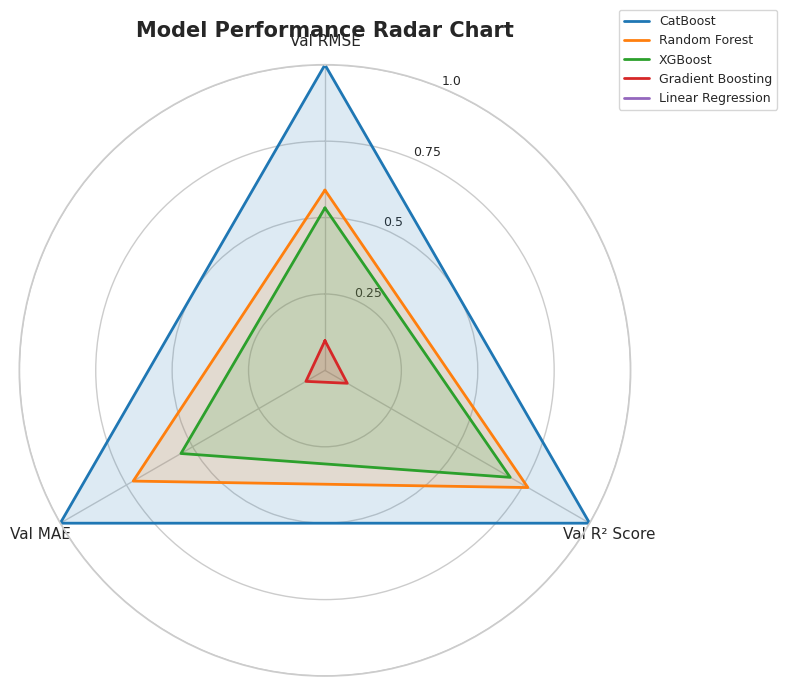

In [ ]:


# ===== STEP 1: Normalize metrics with powered scaling =====
def normalize_metrics(df):
    df_norm = df.copy()

    # Invert RMSE & MAE — lower is better
    df_norm["Val RMSE"] = 1 - ((df["Val RMSE"] - df["Val RMSE"].min()) /
                               (df["Val RMSE"].max() - df["Val RMSE"].min())) ** 0.5

    df_norm["Val MAE"] = 1 - ((df["Val MAE"] - df["Val MAE"].min()) /
                              (df["Val MAE"].max() - df["Val MAE"].min())) ** 0.5

    # R² Score — higher is better
    df_norm["Val R² Score"] = ((df["Val R² Score"] - df["Val R² Score"].min()) /
                               (df["Val R² Score"].max() - df["Val R² Score"].min())) ** 1.5

    return df_norm

# ===== STEP 2: Plot Radar Chart =====
def plot_model_radar(df, title="Model Performance Radar Chart"):
    df_norm = normalize_metrics(df)
    metrics = ["Val RMSE", "Val R² Score", "Val MAE"]
    angles = np.linspace(0, 2 * np.pi, len(metrics), endpoint=False).tolist()
    angles += angles[:1]  # close the loop

    plt.figure(figsize=(8, 8))
    ax = plt.subplot(polar=True)
    plt.title(title, size=15, weight='bold', pad=20)

    colors = plt.cm.tab10.colors

    for i, (_, row) in enumerate(df_norm.iterrows()):
        values = row[metrics].tolist() + [row[metrics[0]]]
        model = row["Model"]
        ax.plot(angles, values, label=model, color=colors[i % len(colors)], linewidth=2)
        ax.fill(angles, values, alpha=0.15, color=colors[i % len(colors)])

    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(metrics, fontsize=11)
    ax.set_yticks([0.25, 0.5, 0.75, 1.0])
    ax.set_yticklabels(["0.25", "0.5", "0.75", "1.0"], fontsize=9)
    ax.set_ylim(0, 1)

    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1.1), fontsize=9)
    plt.tight_layout()
    plt.show()

# ===== STEP 3: Call the function with your DataFrame =====
# Assumes your summary table is named `val_results_df`
plot_model_radar(val_results_df)



In [ ]:

# ------------------------
# 1. CatBoost Hyperparameter Tuning
# ------------------------

cat_params = {
    'depth': [4, 6, 8],
    'learning_rate': [0.01, 0.05, 0.1],
    'iterations': [100, 200, 300]
}

cat_model = CatBoostRegressor( verbose=0, random_state=42)

print("\n Starting CatBoost GridSearchCV...")

with tqdm(total=1, desc="CatBoost Tuning", ncols=100) as pbar:
    grid_cat = GridSearchCV(
        estimator=cat_model,
        param_grid=cat_params,
        cv=3,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1
    )
    grid_cat.fit(X_train, y_train)
    pbar.update(1)

best_cat_model = grid_cat.best_estimator_

# Evaluate on Training and Validation
y_train_pred_cat = best_cat_model.predict(X_train)
y_val_pred_cat = best_cat_model.predict(X_val)

print("\nCatBoost Best Parameters:", grid_cat.best_params_)
print(f"CatBoost - TRAINING --> RMSE: {np.sqrt(mean_squared_error(y_train, y_train_pred_cat)):.4f}, "
      f"R²: {r2_score(y_train, y_train_pred_cat):.4f}, MAE: {mean_absolute_error(y_train, y_train_pred_cat):.4f}")
print(f"CatBoost - VALIDATION --> RMSE: {np.sqrt(mean_squared_error(y_val, y_val_pred_cat)):.4f}, "
      f"R²: {r2_score(y_val, y_val_pred_cat):.4f}, MAE: {mean_absolute_error(y_val, y_val_pred_cat):.4f}")

# ------------------------
# 2. Random Forest Hyperparameter Tuning
# ------------------------

rf_params = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5]
}

rf_model = RandomForestRegressor(random_state=42)

print("\n Starting Random Forest GridSearchCV...")

with tqdm(total=1, desc="Random Forest Tuning", ncols=100) as pbar:
    grid_rf = GridSearchCV(
        estimator=rf_model,
        param_grid=rf_params,
        cv=3,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1
    )
    grid_rf.fit(X_train, y_train)
    pbar.update(1)

best_rf_model = grid_rf.best_estimator_

# Evaluate on Training and Validation
y_train_pred_rf = best_rf_model.predict(X_train)
y_val_pred_rf = best_rf_model.predict(X_val)

print("\nRandom Forest Best Parameters:", grid_rf.best_params_)
print(f"Random Forest - TRAINING --> RMSE: {np.sqrt(mean_squared_error(y_train, y_train_pred_rf)):.4f}, "
      f"R²: {r2_score(y_train, y_train_pred_rf):.4f}, MAE: {mean_absolute_error(y_train, y_train_pred_rf):.4f}")
print(f"Random Forest - VALIDATION --> RMSE: {np.sqrt(mean_squared_error(y_val, y_val_pred_rf)):.4f}, "
      f"R²: {r2_score(y_val, y_val_pred_rf):.4f}, MAE: {mean_absolute_error(y_val, y_val_pred_rf):.4f}")



 Starting CatBoost GridSearchCV...


CatBoost Tuning: 100%|███████████████████████████████████████████████| 1/1 [07:44<00:00, 464.59s/it]



CatBoost Best Parameters: {'depth': 8, 'iterations': 300, 'learning_rate': 0.1}
CatBoost - TRAINING --> RMSE: 0.3577, R²: 0.7420, MAE: 0.2649
CatBoost - VALIDATION --> RMSE: 0.3787, R²: 0.7062, MAE: 0.2774

 Starting Random Forest GridSearchCV...


Random Forest Tuning: 100%|███████████████████████████████████████| 1/1 [1:39:18<00:00, 5958.13s/it]



Random Forest Best Parameters: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 200}
Random Forest - TRAINING --> RMSE: 0.1683, R²: 0.9429, MAE: 0.1180
Random Forest - VALIDATION --> RMSE: 0.3815, R²: 0.7018, MAE: 0.2766


| Model            | Dataset    | RMSE   | R² Score | MAE    |
| ---------------- | ---------- | ------ | -------- | ------ |
| **CatBoost**     | Training   | 0.3577 | 0.7420   | 0.2649 |
|                  | Validation | 0.3787 | 0.7062   | 0.2774 |
| **RandomForest** | Training   | 0.1683 | 0.9429   | 0.1180 |
|                  | Validation | 0.3815 | 0.7018   | 0.2766 |

Key Insights:<br>
- **CatBoost Generalizes Better**<br>
Despite Random Forest performing extremely well on the training data, CatBoost maintains a lower gap between training and validation scores — a sign of better generalization and less overfitting.

- **Random Forest is Overfitting**<br>
The very high training R² (0.94) vs. lower validation R² (0.70) suggests overfitting. While it learns patterns well in training, it fails to replicate that performance on unseen data.

- **Validation Metrics Are Close**<br>
Both models perform similarly on the validation set (RMSE ~0.38, MAE ~0.27), but CatBoost edges ahead slightly in R², making it a more reliable choice for production.


### We go with CatBoost for deployment and final analysis as it offers more stable validation performance , lower risk of overfitting and efficient handling of categorical data.

Final modeling on Catboost model with best hyperparameters.

In [ ]:
# Combine training and validation sets
X_final_train = pd.concat([X_train, X_val])
y_final_train = pd.concat([y_train, y_val])

# Retrain best model (CatBoost) on full training data
final_model = CatBoostRegressor(depth=8,iterations=300,learning_rate=0.1,verbose=0, random_state=42)
final_model.fit(X_final_train, y_final_train)

# Predict on test set
test_preds = final_model .predict(X_test)

# Evaluate on test set
test_rmse = np.sqrt(mean_squared_error(y_test, test_preds))
test_r2 = r2_score(y_test, test_preds)
test_mae = mean_absolute_error(y_test, test_preds)

print(f"Final Test RMSE: {test_rmse:.4f}")
print(f" Final Test R² Score: {test_r2:.4f}")
print(f" Final Test MAE: {test_mae:.4f}")


Final Test RMSE: 0.3727
 Final Test R² Score: 0.7205
 Final Test MAE: 0.2753


### Insights
- The CatBoost model continues to perform strongly on the test set, closely matching validation performance .This indicates the model generalizes well to new, unseen data and is not overfitting.
- An R² over 72% is quite respectable in real-world price prediction tasks, especially for platforms like Airbnb where pricing depends on complex human and geographic factors.
- The relatively low MAE and RMSE suggest your model’s price estimates are reasonably accurate and consistent.



### Actual v/s Predicted values visualization

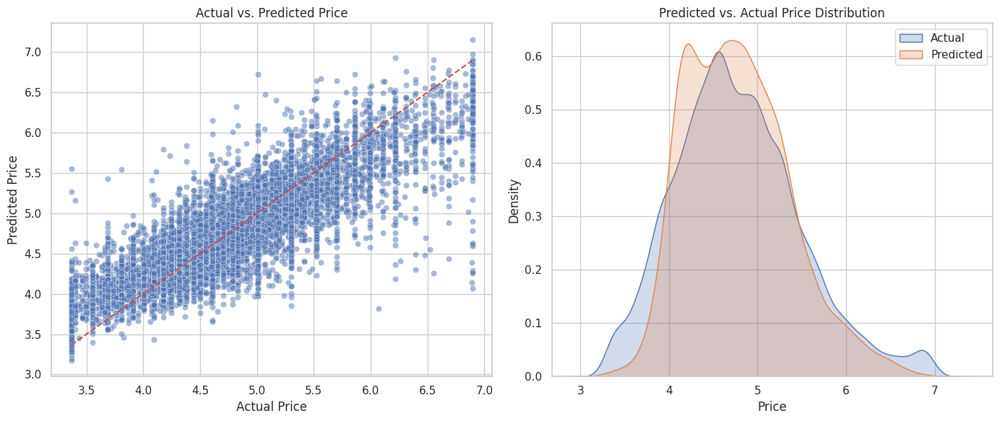

In [ ]:

# Create side-by-side subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# --- Actual vs Predicted Scatter Plot ---
sns.scatterplot(x=y_test, y=test_preds, alpha=0.5, ax=axes[0])
axes[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
axes[0].set_xlabel("Actual Price")
axes[0].set_ylabel("Predicted Price")
axes[0].set_title("Actual vs. Predicted Price")

# --- KDE Plot of Distributions ---
sns.kdeplot(y_test, label='Actual', shade=True, ax=axes[1])
sns.kdeplot(test_preds, label='Predicted', shade=True, ax=axes[1])
axes[1].set_title("Predicted vs. Actual Price Distribution")
axes[1].set_xlabel("Price")
axes[1].legend()

# --- Final adjustments ---
plt.tight_layout()
plt.show()





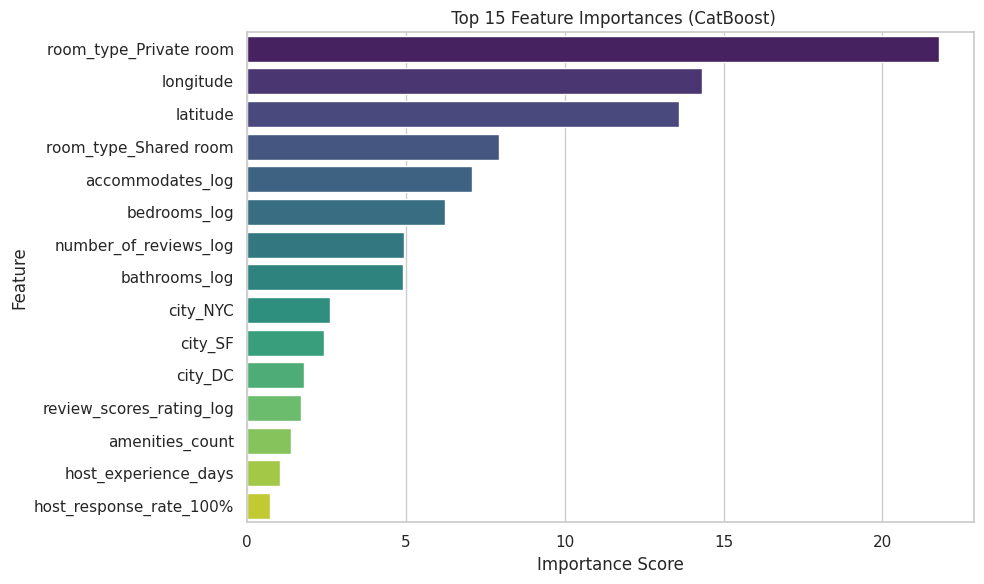

In [ ]:


# Get feature importances
importances = final_model.get_feature_importance()
features = X_final_train.columns

# Plot top 15 features
feat_df = pd.DataFrame({'Feature': features, 'Importance': importances})
feat_df = feat_df.sort_values(by="Importance", ascending=False).head(15)

plt.figure(figsize=(10, 6))
sns.barplot(data=feat_df, x="Importance", y="Feature", palette="viridis")
plt.title(" Top 15 Feature Importances (CatBoost)")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()



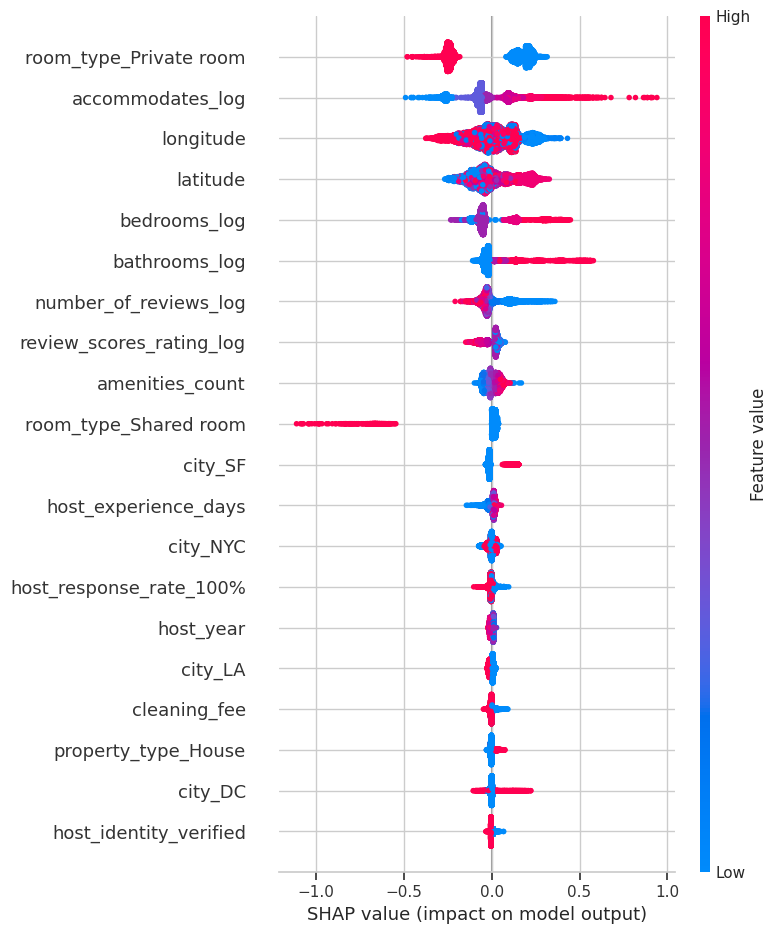

In [ ]:

explainer = shap.Explainer(final_model)
shap_values = explainer(X_val)

# Summary plot
shap.summary_plot(shap_values, X_val, max_display=20)


## Business key insights

1. Room type is the strongest price determinant.Private rooms are priced differently from entire places or shared rooms.so we should emphasize room type categorization in pricing tools.

2. 'longitude & latitude' - together, they represent location — a critical pricing factor.Specific neighborhoods or tourist areas push prices higher so location - based building strategies should made accordingly.

3. room_type_Shared room, accommodates_log, bedrooms_log, bathrooms_log
Size and configuration of the space clearly impact price.More rooms and higher capacity = more value = higher price.Suggest room upgrades or better space descriptions to increase value.

4. number_of_reviews_log & review_scores_rating_log
Listings with more reviews and better ratings can charge more.Incentivize hosts to gather more high-quality reviews.

5. host_experience_days & host_response_rate_100%
More experienced and responsive hosts tend to list at higher prices. Encourage new hosts to focus on responsiveness and hosting quality.

6. amenities_count
More amenities = higher prices, but the impact is moderate. Guide hosts on which amenities improve pricing (e.g., Wi-Fi, kitchen, AC).

#### Conclusion
This feature importance chart helps validate and prioritize what matters most for Airbnb pricing:
- Room type and location dominate
- Space size, ratings, and reviews are essential
- Host experience and amenities add incremental value